# Sentiment Analysis Project

In this project we are supposed to predict the sentiment of a given text, and predict if the text is positive, negative or neutral in nature.

## Step 1: Importing Necessary Libraries

All libraries used anywhere in this notebook are imported once, grouped by purpose.

In [192]:
# Standard library-

import collections
import html
import os
import re
import string
import warnings
from collections import Counter
from pathlib import Path


In [193]:
#  Data handling & visualization- 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from matplotlib import rcParams
from wordcloud import WordCloud, STOPWORDS


In [194]:
# NLP-

import nltk
import contractions
from contractions import fix as expand_contractions
from nltk.corpus import stopwords
from nltk.corpus import stopwords as nltk_stopwords
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize, sent_tokenize
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [195]:
# Machine learning -
import joblib
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, GradientBoostingClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier


In [196]:
# Evaluation metrics -
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    log_loss,
    roc_auc_score,
    classification_report,
    confusion_matrix
)

In [197]:
# Notebook settings-
%matplotlib inline
warnings.filterwarnings('ignore')

print('All imports loaded successfully')


All imports loaded successfully


## Step 2: Downloading NLTK Resources

In [198]:
# Download every NLTK resource used in this notebook (one place only)
for res in ['punkt', 'punkt_tab', 'stopwords', 'wordnet', 'vader_lexicon']:
    nltk.download(res, quiet=True)

print('NLTK resources ready')


NLTK resources ready


## Step 3: Loading the Data

Dataset paths are defined once here and reused by every later step.

In [199]:
# Project paths -
BASE_DIR = Path("D:\\Sentiment Project")

# Dataset 1-
TEXT_ANALYTICS_PATH = BASE_DIR / "TextAnalytics.txt"

# Dataset 2 - SST-2
SST_DIR = BASE_DIR / "SST-2"

# Dataset 2 - PTB trees
PTB_TREES_DIR = SST_DIR / "trees"

# Dataset 3 - IMDB
IMDB_PATH = BASE_DIR / "IMDB Dataset.csv"


In [200]:
# Read TextAnalytics.txt-
with open(TEXT_ANALYTICS_PATH, 'r', encoding='utf-8') as f:
    text = f.read()

print("TextAnalytics loaded successfully")

TextAnalytics loaded successfully


In [201]:
# Data look like-
text

'0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you\'ll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to th

## Step 4: Text Normalization

Splitting the raw text at newlines and tabs, then keeping only letters.

In [202]:
# Splitting at (\n):

text=text.split('\n')

In [203]:
# splitting at ( \t ).
corpus = [text]
for sent in text:
    corpus.append(sent.split('\t'))

In [204]:
# Taking only letters-
letters_only = re.sub(r'[^a-zA-Z]',
                          " ",
                          str(corpus))

## Step 5: Configuration - Stopwords and NLP Tools

Negation words such as *not*, *never*, *but* are removed from the stopword list, because they carry the sentiment of a sentence.

In [205]:
# ---------- Negation-aware stopwords ----------
RAW_STOP_WORDS = set(nltk_stopwords.words('english'))

NEGATIONS = {
    'no', 'not', 'nor', 'neither', 'never', 'none', 'cannot',
    "don't", "aren't", "couldn't", "didn't", "doesn't", "hadn't",
    "hasn't", "haven't", "isn't", "mightn't", "mustn't", "needn't",
    "shan't", "shouldn't", "wasn't", "weren't", "won't", "wouldn't",
    'against', 'but', 'however', 'although', 'though', 'yet'
}

STOP_WORDS = RAW_STOP_WORDS - NEGATIONS


In [206]:
# NLP Tools-

LEMMATIZER = WordNetLemmatizer()
ANALYZER = SentimentIntensityAnalyzer()

# Display Information-
print(f'Total stopwords: {len(RAW_STOP_WORDS)}')
print(f'After negation preservation: {len(STOP_WORDS)}')
print(f'Preserved negation words: {len(NEGATIONS)}')

print("\n All configuration loaded successfully!")

Total stopwords: 198
After negation preservation: 175
Preserved negation words: 31

 All configuration loaded successfully!


## Step 6: Tokenization

In [207]:
# converting to lowercase.
letters_only=letters_only.lower()

token=nltk.sent_tokenize(letters_only)
token

['      one of the other reviewers has mentioned that after watching just   oz episode you  ll be hooked  they are right  as this is exactly what happened with me  br    br   the first thing that struck me about oz was its brutality and unflinching scenes of violence  which set in right from the word go  trust me  this is not a show for the faint hearted or timid  this show pulls no punches with regards to drugs  sex or violence  its is hardcore  in the classic use of the word  br    br   it is called oz as that is the nickname given to the oswald maximum security state penitentary  it focuses mainly on emerald city  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  em city is home to many  aryans  muslims  gangstas  latinos  christians  italians  irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   i would say the main appeal of the show is due t

## Step 7: Contraction Removal and Alphanumeric Handling

A contraction is a short form such as *isn't*, *didn't*. They are expanded before tokenizing:

isn't --> is not, I'm --> I am, they're --> they are, shouldn't --> should not, can't --> can not

Numbers and mixed tokens are then replaced by placeholder symbols.

In [208]:
# Contraction Removal-

def contraction_remove(text):
    return contractions.fix(text)

In [209]:
# Word Tokenization-

def w_tokenization(text):
    text = text.lower()
    text = contraction_remove(text)
    tokens = nltk.word_tokenize(text)
    return tokens

In [210]:
# Number, Decimal and Alphabetic Character Handling-

def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

In [211]:
# Cleaning Numbers, Decimals and Alphabets-

def clean_nda(sentence_text):
    tokens = w_tokenization(sentence_text)
    map_list = list(map(num_dec_al, tokens))
    return " ".join(map_list)

In [212]:

# Corpus Creation After Text Cleaning-

if 'token' in locals() or 'token' in globals():
    corpus_nda = list(map(clean_nda, token))
    print(corpus_nda)
else:
    print("Warning: 'token' variable not defined. Please run cell iwL9C2sJEKPt first.")

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda them city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t

In [213]:
corpus_nda

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda them city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t

## Step 8: Building the DataFrame

The cleaned text is separated at tab and newline, then stored in a DataFrame.

In [214]:
# Separating at tab
data = [corpus_nda]
for sent in text:
    data.append(sent.split('\t'))

In [215]:
# Separating at newline-
data.append(sent.split('\n'))


In [216]:
# Cleaning text-

data

[['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda them city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn 

In [217]:
# Saving the data into a dataframe.

df = pd.DataFrame(data)

In [218]:
df

,0,1,2,3,4,5,6
0,one of the other reviewers has mentioned that ...,NaN,NaN,NaN,NaN,NaN,NaN
1,"0,""One of the other reviewers has mentioned th...",NaN,NaN,NaN,NaN,NaN,NaN
2,"1,""A wonderful little production. <br /><br />...",NaN,NaN,NaN,NaN,NaN,NaN
3,"2,""I thought this was a wonderful way to spend...",NaN,NaN,NaN,NaN,NaN,NaN
4,"3,""Basically there's a family where a little b...",NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
997,"996,""I hated it. I hate self-aware pretentious...",NaN,NaN,NaN,NaN,NaN,NaN
998,"997,""I usually try to be professional and cons...",NaN,NaN,NaN,NaN,NaN,NaN
999,"998,""If you like me is going to see this in a ...",NaN,NaN,NaN,NaN,NaN,NaN
1000,"999,""This is like a zoology textbook, given th...",NaN,NaN,NaN,NaN,NaN,NaN


## Step 9: Dropping Unnecessary Columns

In [219]:
# dropping unnecessary columns.
df.drop([1,2,3,4,5,6],axis=1,inplace=True)

In [220]:
# Resulting dataframe-
df

,0
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


In [221]:
# Renaming the column 0 as 'Text'
df= df.rename(columns={0: 'Text'})

In [222]:
df

,Text
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


## Step 10: Removing Repeated Rows

Rows 0, 1 and 1000, 1001 are repeated, so they are dropped.

In [223]:
# Row 1 has repeated so it is dropped-
df.drop(df.index[:1], inplace = True)

In [224]:
# Row 1000 has repeated as well so it is dropped-
df.drop(df.index[1000:], inplace = True)

In [225]:
df

,Text
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
5,"4,""Petter Mattei's """"Love in the Time of Money..."
...,...
996,"995,""Nothing is sacred. Just ask Ernie Fosseli..."
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."


## Step 11: Removing Additional Special Characters

In [226]:
# We can further see that there are still some special characters in the dataframe which have to be treated.

df.replace('\d+', '', regex=True, inplace=True)
df.replace(',', '', regex=True, inplace=True)
df.replace('br', '', regex=True, inplace=True)
df.replace('"', '', regex=True, inplace=True)
df.replace("'", '', regex=True, inplace=True)
df.replace('?', '', inplace=True)
df.replace("-", '', regex=True, inplace=True)
df.replace("*", '', inplace=True)
df.replace("***", '', inplace=True)
df.replace("< />", '', regex=True, inplace=True)

,Text
1,One of the other reviewers has mentioned that ...
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...


In [227]:
# Using the strip function in order to delete the special characters.

df['Text'] = df['Text'].str.strip('[')
df['Text'] = df['Text'].str.strip(']')
df['Text'] = df['Text'].str.strip('(')
df['Text'] = df['Text'].str.strip(')')

In [228]:
df

,Text
1,One of the other reviewers has mentioned that ...
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...


## Step 12: Lemmatization of the Text Column

In [229]:
# NLP Text Preprocessing – Lemmatization-

def lemmatization_sentence(sentence):
    lemmatizer = WordNetLemmatizer()
    tokens = word_tokenize(sentence)
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(lemmatized_tokens)

## Step 13: Preparing Tokens from the Text Column

In [230]:
Text = df['Text']

In [231]:
# As_matrix() function is used to convert the given series or dataframe object to Numpy-array representation.

token = Text.to_numpy()

In [232]:
# Sentence tokenization-

token = nltk.sent_tokenize(str(token))

In [233]:
# Saving token on form of array-

data = np.array(token)

In [234]:
# Saving stopwords in stop-

stop = stopwords.words('english')

## Step 14: Removing Stopwords from the DataFrame

In [235]:
# Removing stopwords from the text and printing the words without stopwords

text = data
text_tokens = word_tokenize(str(text))

tokens_without_sw = [word for word in text_tokens if not word in stop]

print(tokens_without_sw)

['[', '``', '[', "'", 'One', 'reviewers', 'mentioned', 'watching', 'Oz', 'episode', 'youll', 'hooked', '.', "''", "'", 'They', 'right', 'exactly', 'happened', 'me.The', 'first', 'thing', 'struck', 'Oz', 'utality', 'unflinching', 'scenes', 'violence', 'set', 'right', 'word', 'GO', '.', "'", "'", 'Trust', 'show', 'faint', 'hearted', 'timid', '.', "'", '...', "'", 'Any', 'time', 'youre', 'hunted', 'giant', 'creatures', 'great', 'time', 'hit', 'girls', 'half', 'age', '.', "'", "'", 'Animal', 'noises', 'appropriate', 'masking', 'noise', 'swearing', 'volume', '.', "'", '``', 'Old', 'Israeli', 'Russian', 'planes', 'regularly', 'used', 'US', 'Military', '.', "'", ']', "''", ']']


## Step 15: Visualization - WordCloud

A WordCloud shows which words are the most frequent in the text.

In [236]:
# Removing stopwords for wordcloud visualization

stopwords = set(stopwords.words("english"))

In [237]:
wordcloud = WordCloud(stopwords=stop, background_color="white", max_words=1000).generate(str(tokens_without_sw))
# # WordCloud is a technique to show which words are the most frequent among the given text

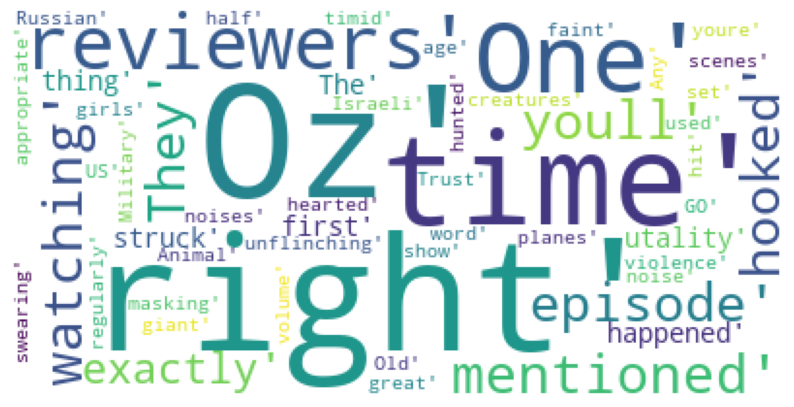

In [238]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## Step 16: Counting Word Frequencies

In [239]:
tokens_without_sw = (str(tokens_without_sw))

In [240]:
# Removing stopwords as creating two lists to display the words and their counts
filtered_words = [word for word in tokens_without_sw.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)


In [241]:
counted_words.most_common(100) # the word 'movie' has repeated for 2081 times.

[('"\'",', 10),
 ("'.',", 6),
 ("'``',", 2),
 ("'Oz',", 2),
 ('"\'\'",', 2),
 ("'right',", 2),
 ("'time',", 2),
 ("['[',", 1),
 ("'[',", 1),
 ("'One',", 1),
 ("'reviewers',", 1),
 ("'mentioned',", 1),
 ("'watching',", 1),
 ("'episode',", 1),
 ("'youll',", 1),
 ("'hooked',", 1),
 ("'They',", 1),
 ("'exactly',", 1),
 ("'happened',", 1),
 ("'me.The',", 1),
 ("'first',", 1),
 ("'thing',", 1),
 ("'struck',", 1),
 ("'utality',", 1),
 ("'unflinching',", 1),
 ("'scenes',", 1),
 ("'violence',", 1),
 ("'set',", 1),
 ("'word',", 1),
 ("'GO',", 1),
 ("'Trust',", 1),
 ("'show',", 1),
 ("'faint',", 1),
 ("'hearted',", 1),
 ("'timid',", 1),
 ("'...',", 1),
 ("'Any',", 1),
 ("'youre',", 1),
 ("'hunted',", 1),
 ("'giant',", 1),
 ("'creatures',", 1),
 ("'great',", 1),
 ("'hit',", 1),
 ("'girls',", 1),
 ("'half',", 1),
 ("'age',", 1),
 ("'Animal',", 1),
 ("'noises',", 1),
 ("'appropriate',", 1),
 ("'masking',", 1),
 ("'noise',", 1),
 ("'swearing',", 1),
 ("'volume',", 1),
 ("'Old',", 1),
 ("'Israeli',", 

## Step 17: Visualizing the Top 10 Repeated Words

<BarContainer object of 10 artists>

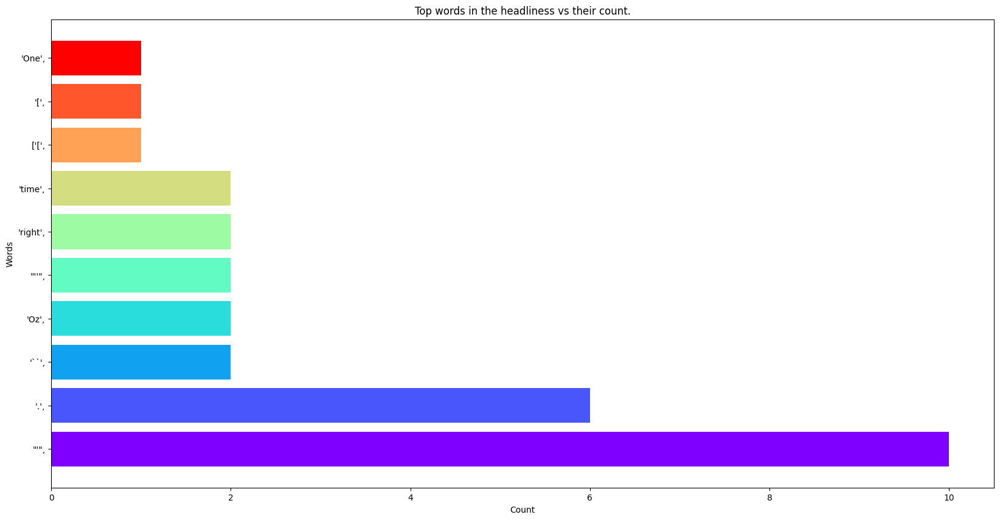

In [242]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headliness vs their count.')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

## Step 18: VADER Sentiment Analysis on Words

VADER is used to find whether a given **word** is positive, negative or neutral.

In [243]:
sentence = tokens_without_sw
tokenized_sentence = nltk.word_tokenize(sentence)

sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)

print('Positive:',pos_word_list)
print('Neutral:',neu_word_list)
print('Negative:',neg_word_list)
score = sid.polarity_scores(sentence)
print('\nScores:', score)

Positive: ['Trust', 'great']
Neutral: ['[', "'", '[', "'", ',', "'", '``', "'", ',', "'", '[', "'", ',', '``', "'", "''", ',', "'", 'One', "'", ',', "'", 'reviewers', "'", ',', "'", 'mentioned', "'", ',', "'", 'watching', "'", ',', "'", 'Oz', "'", ',', "'", 'episode', "'", ',', "'", 'youll', "'", ',', "'", 'hooked', "'", ',', "'", '.', "'", ',', '``', "''", "''", ',', '``', "'", "''", ',', "'", 'They', "'", ',', "'", 'right', "'", ',', "'", 'exactly', "'", ',', "'", 'happened', "'", ',', "'", 'me.The', "'", ',', "'", 'first', "'", ',', "'", 'thing', "'", ',', "'", "'", ',', "'", 'Oz', "'", ',', "'", 'utality', "'", ',', "'", 'unflinching', "'", ',', "'", 'scenes', "'", ',', "'", "'", ',', "'", 'set', "'", ',', "'", 'right', "'", ',', "'", 'word', "'", ',', "'", 'GO', "'", ',', "'", '.', "'", ',', '``', "'", "''", ',', '``', "'", "''", ',', "'", "'", ',', "'", 'show', "'", ',', "'", 'faint', "'", ',', "'", 'hearted', "'", ',', "'", "'", ',', "'", '.', "'", ',', '``', "'", "''", ',', "'"

In [244]:
pos_word_list[:100]
neg_word_list[:100]

['struck', 'violence', 'timid', 'swearing']

## Step 19: Top 100 Positive Words

In [245]:
# These are the top 100 positive words found in the dataset.

print(list(iter(pos_word_list[:100])))

['Trust', 'great']


## Step 20: Top 100 Negative Words

In [246]:
# These are the top 100 negative words found in the dataset.

print(list(iter(neg_word_list[:100])))

['struck', 'violence', 'timid', 'swearing']


## Step 21: VADER Sentiment Analysis on Sentences

VADER is used to find whether a given **sentence** is positive, negative or neutral.

In [247]:
sid = SentimentIntensityAnalyzer()
for sentence in Text:
  print(sentence)

  ss = sid.polarity_scores(sentence)
  for k in ss:
    print('{0}: {1}, '.format(k, ss[k]), end='')
  print()

One of the other reviewers has mentioned that after watching just  Oz episode youll be hooked. They are right as this is exactly what happened with me.The first thing that struck me about Oz was its utality and unflinching scenes of violence which set in right from the word GO. Trust me this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs sex or violence. Its is hardcore in the classic use of the word.It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda. Em City is home to many..Aryans Muslims gangstas Latinos Christians Italians Irish and more....so scuffles death stares dodgy dealings and shady agreements are never far away.I would say the main appeal of the show is due to the fact that it goes where other shows wouldnt dare. Forget p

## Step 22: Converting Polarity Scores into a DataFrame

In [248]:
# Creating a dataframe.

analyzer = SentimentIntensityAnalyzer()
df['rating'] = Text.apply(analyzer.polarity_scores)
df=pd.concat([df.drop(['rating'], axis=1), df['rating'].apply(pd.Series)], axis=1)

In [249]:
df.head()

,Text,neg,neu,pos,compound
1,One of the other reviewers has mentioned that ...,0.176,0.758,0.066,-0.9907
2,A wonderful little production. The filming tec...,0.053,0.765,0.182,0.9670
3,I thought this was a wonderful way to spend ti...,0.116,0.675,0.210,0.9579
4,Basically theres a family where a little boy (...,0.130,0.808,0.062,-0.9213
5,Petter Matteis Love in the Time of Money is a ...,0.052,0.800,0.148,0.9744


## Step 23: Finding the Most Important Sentence

The data is sorted in descending order of the compound score.

In [250]:
# arranging the compound column in descending order to find the best sentence.

imp_sent=df.sort_values(by='compound', ascending=False)

In [251]:
imp_sent

,Text,neg,neu,pos,compound
411,I firmly believe that the best Oscar ceremony ...,0.087,0.621,0.292,0.9996
567,Few would argue that master animation director...,0.042,0.743,0.215,0.9995
364,The plot: Michael Linnett Connors has done eve...,0.018,0.816,0.166,0.9992
211,I have just given a for Thieves Highway I men...,0.094,0.637,0.269,0.9992
944,A film for mature educated audiences...I saw R...,0.073,0.678,0.249,0.9990
...,...,...,...,...,...
354,This film held my interest enough to watch it ...,0.193,0.702,0.105,-0.9981
247,This show makes absolutely no sense. Every wee...,0.332,0.617,0.052,-0.9982
323,If only I had read the review by Alex Sander (...,0.197,0.713,0.089,-0.9983
766,This film cant make up its mind whether its me...,0.255,0.649,0.096,-0.9988


In [252]:
# Print the sentence with the highest compound score-

print(df['Text'].iloc[410])

I firmly believe that the best Oscar ceremony in recent years was in  for two reasons:  ) Host Steve Martin was at his most wittiest:  I saw the teamsters help Michael Moore into the trunk of his limo  and  Ill better not mention the gay mafia in case I wake up with a poodles head in my bed   ) Surprise winners: No one had Adrien Brody down for best actor ( Genuine applause ) or Roman Polanski for best director ( Genuine jeers and boos ) but they won Last years award ceremony wasnt too bad but there was little in the way of surprises and I was happy to see RETURN OF THE KING sweep the awards even if it wasnt the best in the trilogy ( FELLOWSHIP was much better )but what let the BBC coverage down was Jonathan Ross getting a few of his sycophantic mates round and pretending they were hilarious when they were anything but . So when I heard Sky were doing the coverage for British TV I was expecting Barry Norman and Mark Kermode to be doing the links  but instead we ended up with Jamie Thea

## Step 24: Finding the Top Positive Sentence

In [253]:
# Arranging the dataframe by positive column in descending order to find the best postive sentence.

pos_sent=df.sort_values(by='pos', ascending=False)

In [254]:
pos_sent

,Text,neg,neu,pos,compound
161,MYSTERY MEN has got to be THE stupidest film I...,0.099,0.446,0.455,0.9896
10,If you like original gut wrenching laughter yo...,0.098,0.511,0.391,0.9149
322,I have watched this movie countless times and ...,0.000,0.662,0.338,0.9836
382,This film was pretty good. I am not too big a ...,0.035,0.627,0.338,0.9944
598,In short if you want to watch Burt Reynolds be...,0.040,0.626,0.334,0.9970
...,...,...,...,...,...
836,The story has been told before. A deadly disea...,0.056,0.944,0.000,-0.4497
340,I find the critique of many IMDb users a littl...,0.130,0.870,0.000,-0.9653
756,A wellmade runofthemill movie with a tragic en...,0.128,0.872,0.000,-0.8402
414,A rating of does not begin to express how dul...,0.386,0.614,0.000,-0.8316


In [255]:
# Sentence with index 160 has the highest positive score and is the most postive.

print(df['Text'].iloc[160] )

MYSTERY MEN has got to be THE stupidest film Ive ever seen but what a film! I thought it was fabulous excellent and impressive. It was funny welldone and nice to see ridiculous Super Heroes for a change! And being able to pull it off! This was great! Ill definitely watch it again!


## Step 25: Finding the Top Negative Sentence

In [256]:
# Arranging the dataframe by negative column in descending order to find the best negative sentence.

neg_sent=df.sort_values(by='neg', ascending=False)

In [257]:
neg_sent

,Text,neg,neu,pos,compound
414,A rating of does not begin to express how dul...,0.386,0.614,0.000,-0.8316
737,Baba Rajinikanth will never forget this name ...,0.343,0.629,0.027,-0.9954
247,This show makes absolutely no sense. Every wee...,0.332,0.617,0.052,-0.9982
282,After a very scary crude opening which gives y...,0.325,0.614,0.061,-0.9894
98,Well I like to watch bad horror BMovies cause ...,0.318,0.561,0.121,-0.9907
...,...,...,...,...,...
426,If you like SciFi Monsters and Ancient Legends...,0.000,0.763,0.237,0.9772
470,Although the plot of this film is a bit farfet...,0.000,0.724,0.276,0.9545
448,i am finally seeing the El Padrino movie from ...,0.000,0.772,0.228,0.9896
962,I agree with BigAlC this movie actually prepa...,0.000,0.790,0.210,0.9850


In [258]:
# sentence with index 413 has the highest negative score and is the most negative sentence

print(df['Text'].iloc[413] )

A rating of  does not begin to express how dull depressing and relentlessly bad this movie is.


## Step 26: Threshold Based Sentiment Classification

Threshold values decide whether a sentence is positive, negative or neutral.

In [259]:
sentences=df

In [260]:
# Classify sentences as positive, neutral, or negative

i = 0

predicted_value = []

while i < len(sentences):

    if sentences.iloc[i]['compound'] >= 0.5:
        predicted_value.append('positive')

    elif sentences.iloc[i]['compound'] > 0:
        predicted_value.append('neutral')

    else:
        predicted_value.append('negative')

    i = i + 1

# Store the predicted sentiment values
print(predicted_value)

['negative', 'positive', 'positive', 'negative', 'positive', 'positive', 'positive', 'neutral', 'neutral', 'positive', 'positive', 'positive', 'positive', 'neutral', 'negative', 'negative', 'neutral', 'negative', 'positive', 'positive', 'positive', 'negative', 'positive', 'positive', 'negative', 'positive', 'positive', 'negative', 'negative', 'negative', 'negative', 'negative', 'negative', 'positive', 'positive', 'negative', 'negative', 'negative', 'positive', 'positive', 'neutral', 'positive', 'negative', 'positive', 'positive', 'positive', 'positive', 'negative', 'positive', 'neutral', 'positive', 'positive', 'negative', 'positive', 'negative', 'negative', 'negative', 'positive', 'negative', 'positive', 'positive', 'negative', 'positive', 'negative', 'neutral', 'negative', 'positive', 'positive', 'positive', 'positive', 'positive', 'positive', 'neutral', 'positive', 'positive', 'positive', 'negative', 'negative', 'neutral', 'positive', 'positive', 'negative', 'negative', 'negative', 

In [261]:
predicted_value

['negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'neutral',
 'neutral',
 'positive',
 'positive',
 'positive',
 'positive',
 'neutral',
 'negative',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'neutral',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'negative',
 'positive',
 'neutral',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'neutral',
 'negative',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'positive',
 'neutral',
 'positive',
 'positive',
 'positive',
 'negative',
 'negat

## Step 27: Adding the Target Column

In [262]:
# A new column has been created called as 'Target' with sentiments assigned to a given text.

df['Target'] = predicted_value

In [263]:
df.head()

,Text,neg,neu,pos,compound,Target
1,One of the other reviewers has mentioned that ...,0.176,0.758,0.066,-0.9907,negative
2,A wonderful little production. The filming tec...,0.053,0.765,0.182,0.9670,positive
3,I thought this was a wonderful way to spend ti...,0.116,0.675,0.210,0.9579,positive
4,Basically theres a family where a little boy (...,0.130,0.808,0.062,-0.9213,negative
5,Petter Matteis Love in the Time of Money is a ...,0.052,0.800,0.148,0.9744,positive


## Step 28: Dropping the Score Columns

In [264]:
# Dropping the neg, neu, pos, and compound columns.

df.drop(['neg', 'neu', 'pos', 'compound'], axis=1, inplace=True)

In [265]:
# Final dataframe with sentiments.

df

,Text,Target
1,One of the other reviewers has mentioned that ...,negative
2,A wonderful little production. The filming tec...,positive
3,I thought this was a wonderful way to spend ti...,positive
4,Basically theres a family where a little boy (...,negative
5,Petter Matteis Love in the Time of Money is a ...,positive
...,...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...,neutral
997,I hated it. I hate selfaware pretentious inani...,negative
998,I usually try to be professional and construct...,negative
999,If you like me is going to see this in a film ...,negative


In [266]:
# There are 577 positive, 363 negative and 60 neutral columns present in the dataset.

df['Target'].value_counts()

Target
positive    577
negative    363
neutral      60
Name: count, dtype: int64

## Step 29: Label Encoding the Target Column

In [267]:
# Label Encoding the target column.

cat_cols = ['Target']
le = LabelEncoder()
for i in cat_cols:
  df[i] = le.fit_transform(df[i])
df.dtypes

Text        str
Target    int64
dtype: object

In [268]:
# Label encoded value_counts()

df['Target'].value_counts()

Target
2    577
0    363
1     60
Name: count, dtype: int64

In [269]:
df

,Text,Target
1,One of the other reviewers has mentioned that ...,0
2,A wonderful little production. The filming tec...,2
3,I thought this was a wonderful way to spend ti...,2
4,Basically theres a family where a little boy (...,0
5,Petter Matteis Love in the Time of Money is a ...,2
...,...,...
996,Nothing is sacred. Just ask Ernie Fosselius. T...,1
997,I hated it. I hate selfaware pretentious inani...,0
998,I usually try to be professional and construct...,0
999,If you like me is going to see this in a film ...,0


## Step 30: Advanced Preprocessing Pipeline

Full pipeline: normalize -> expand contractions -> tokenize -> filter -> lemmatize.

In [270]:
# Text Normalization-

def normalize_text(text):
    if not isinstance(text, str):
        return ''

    # Convert HTML characters
    text = html.unescape(text)

    # Remove URLs
    text = re.sub(r'https?://\S+|www\.\S+', ' ', text)

    # Remove @ mentions
    text = re.sub(r'@\w+', ' ', text)

    # Remove HTML line breaks
    text = text.replace('<br />', ' ').replace('<br>', ' ').replace('<br/>', ' ')

    # Remove HTML tags-
    text = re.sub(r'<[^>]+>', ' ', text)

    # Remove extra spaces-
    return text.strip()

In [271]:
# Full NLP Preprocessing-

def preprocess_text(text):
    # Normalize the text and convert to lowercase
    text = normalize_text(text).lower()

    # Expand contractions
    text = expand_contractions(text)

    # Keep only letters and spaces
    text = re.sub(r'[^a-zA-Z\s]', ' ', text)

    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove stopwords and short words, then lemmatize
    tokens = [
        LEMMATIZER.lemmatize(tok)
        for tok in tokens
        if tok not in STOP_WORDS
        and tok not in string.punctuation
        and len(tok) > 1
    ]

    # Join tokens back into a sentence
    return ' '.join(tokens)

In [272]:
# Testing the Preprocessing Function-

test_text = "I don't think this movie was good at all! <br /><br />Terrible acting."

print(f'Original : {test_text}')
print(f'Processed: {preprocess_text(test_text)}')

Original : I don't think this movie was good at all! <br /><br />Terrible acting.
Processed: not think movie good terrible acting


## Step 31: PTB Tree Parsing Functions

In [273]:
# Extract words from a PTB parse tree

def extract_text_from_ptb_tree(tree_str):
    # Extract leaf words from the parse tree
    tokens = re.findall(r'\([\d] ([^\(\)]+)\)', tree_str)
    return ' '.join(tokens).strip()

In [274]:
# Extract the sentiment label from the root of the PTB tree-

def extract_root_label(tree_str):
    # Get the root sentiment label (0-4)
    
    match = re.match(r'^\((\d)', tree_str.strip())

    return int(match.group(1)) if match else -1

In [275]:
# Convert PTB labels into positive or negative sentiment

def ptb_label_to_binary(label):
    # 0, 1 = Negative
    if label in (0, 1):
        return 'negative'

    # 3, 4 = Positive
    elif label in (3, 4):
        return 'positive'

    # Skip neutral label (2)
    return None

print('PTB parsing functions defined')

PTB parsing functions defined


## Step 32: Multi-Dataset Loading

Loading and combining **all available datasets** with binary (positive/negative) classification.

In [276]:
all_texts = []
all_labels = []

In [277]:
# 1. LOAD IMDB DATASET


if IMDB_PATH.exists():
    print("Loading IMDB Dataset")

    df_imdb = pd.read_csv(IMDB_PATH)

    for _, row in df_imdb.iterrows():
        rev = str(row['review']).strip()
        sent = str(row['sentiment']).strip().lower()

        if rev and sent in ('positive', 'negative'):
            all_texts.append(rev)
            all_labels.append(sent)

    print(f"Loaded {len(all_texts):,} samples from IMDB")

else:
    print("IMDB Dataset not found!")

Loading IMDB Dataset
Loaded 50,000 samples from IMDB


In [278]:
# 2. LOAD STANFORD SENTIMENT TREEBANK

if SST_DIR.exists():
    prev = len(all_texts)

    print("Loading Stanford Sentiment Treebank...")

    try:
        sst_sents = pd.read_csv(
            SST_DIR / 'datasetSentences.txt',
            sep='\t'
        )

        sst_dict = pd.read_csv(
            SST_DIR / 'dictionary.txt',
            sep='|',
            names=['phrase', 'phrase_id']
        )

        sst_labels = pd.read_csv(
            SST_DIR / 'sentiment_labels.txt',
            sep='|'
        )

        score_map = dict(
            zip(
                sst_labels['phrase ids'],
                sst_labels['sentiment values']
            )
        )

        phrase_map = dict(
            zip(
                sst_dict['phrase'],
                sst_dict['phrase_id']
            )
        )

        for _, row in sst_sents.iterrows():
            sentence = str(row['sentence']).strip()

            if not sentence:
                continue

            p_id = phrase_map.get(sentence)

            if p_id is not None and p_id in score_map:
                score = score_map[p_id]

                if score <= 0.4:
                    all_texts.append(sentence)
                    all_labels.append('negative')

                elif score >= 0.6:
                    all_texts.append(sentence)
                    all_labels.append('positive')

        print(
            f"Loaded {len(all_texts) - prev:,} "
            "binary samples from SST"
        )

    except Exception as e:
        print(f"SST parsing error: {e}")

else:
    print("SST Dataset not found!")

SST Dataset not found!


In [279]:
# 3. LOAD PTB SENTIMENT TREES

if PTB_TREES_DIR.exists():
    prev = len(all_texts)

    print("Loading PTB Sentiment Trees...")

    seen_sentences = set()

    for split_file in ['train.txt', 'dev.txt', 'test.txt']:

        ptb_path = PTB_TREES_DIR / split_file

        if not ptb_path.exists():
            continue

        with open(ptb_path, 'r', encoding='utf-8') as f:

            for line in f:
                line = line.strip()

                if not line:
                    continue

                root_label = extract_root_label(line)

                sentiment = ptb_label_to_binary(root_label)

                if sentiment is None:
                    continue

                sentence = extract_text_from_ptb_tree(line)

                if sentence and sentence not in seen_sentences:
                    seen_sentences.add(sentence)

                    all_texts.append(sentence)
                    all_labels.append(sentiment)

    print(
        f"Loaded {len(all_texts) - prev:,} "
        "binary samples from PTB"
    )

else:
    print("PTB Dataset not found!")

PTB Dataset not found!


In [280]:
# 4. LOAD TEXTANALYTICS DATASET-

if TEXT_ANALYTICS_PATH.exists():
    prev = len(all_texts)

    print("Loading TextAnalytics.txt...")

    # Avoid duplicate IMDB reviews
    imdb_prefixes = set(
        t[:200] for t in all_texts[:50000]
    )

    with open(
        TEXT_ANALYTICS_PATH,
        'r',
        encoding='utf-8'
    ) as f:

        for raw_line in f:

            line = raw_line.strip()

            if line and ',' in line:

                _, review = line.split(',', 1)

                review = review.strip().strip('"')

                if review and review[:200] not in imdb_prefixes:

                    score = ANALYZER.polarity_scores(
                        review
                    )['compound']

                    if score >= 0.1:
                        all_texts.append(review)
                        all_labels.append('positive')

                    elif score <= -0.1:
                        all_texts.append(review)
                        all_labels.append('negative')

    print(
        f"Loaded {len(all_texts) - prev:,} "
        "unique samples from TextAnalytics"
    )

else:
    print("TextAnalytics Dataset not found!")

Loading TextAnalytics.txt...
Loaded 156 unique samples from TextAnalytics


In [281]:
# 5.  COMBINED DATASET SUMMARY-

print(f"\nTotal Combined Dataset: {len(all_texts):,} samples")

dist = Counter(all_labels)

for cls, count in sorted(dist.items()):
    percentage = count / len(all_labels) * 100

    print(
        f"{cls}: {count:,} "
        f"({percentage:.1f}%)"
    )


Total Combined Dataset: 50,156 samples
negative: 25,058 (50.0%)
positive: 25,098 (50.0%)


## Step 33: Dataset Distribution and Exploration

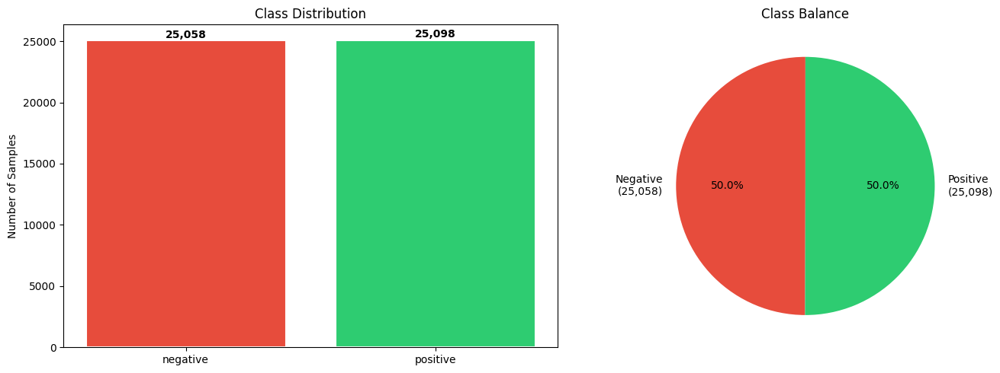


Text Length Statistics:
Mean: 231 words
Median: 173 words
Max: 2,470 words
Min: 4 words


In [282]:
# Visualize class distribution

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar chart
dist = Counter(all_labels)
classes = sorted(dist.keys())
counts = [dist[c] for c in classes]

colors = ['#e74c3c', '#2ecc71']

axes[0].bar(
    classes,
    counts,
    color=colors,
    edgecolor='white',
    linewidth=1.5
)

axes[0].set_title('Class Distribution')
axes[0].set_ylabel('Number of Samples')

for i, (cls, cnt) in enumerate(zip(classes, counts)):
    axes[0].text(
        i,
        cnt + 200,
        f'{cnt:,}',
        ha='center',
        fontweight='bold'
    )

# Pie chart
axes[1].pie(
    counts,
    labels=[
        f'{c.capitalize()}\n({cnt:,})'
        for c, cnt in zip(classes, counts)
    ],
    colors=colors,
    autopct='%1.1f%%',
    startangle=90
)

axes[1].set_title('Class Balance')

plt.tight_layout()
plt.show()


# Calculate text length
lengths = [len(t.split()) for t in all_texts]

print('\nText Length Statistics:')
print(f'Mean: {np.mean(lengths):.0f} words')
print(f'Median: {np.median(lengths):.0f} words')
print(f'Max: {np.max(lengths):,} words')
print(f'Min: {np.min(lengths)} words')

## Step 34: Preprocessing All Samples

In [283]:
# Preprocess all text samples-

print('Preprocessing all text samples...')
processed_texts = [preprocess_text(t) for t in all_texts]

# Show before and after examples-
print('\nPreprocessing Examples:')

for i in [0, 1, 50001]:

    if i < len(all_texts):

        print(f'\n Sample {i} [{all_labels[i]}]-')

        print(f'Original : {all_texts[i][:200]}-')
        print(f'Processed : {processed_texts[i][:200]}.')


print(f'\nPreprocessed {len(processed_texts):,} samples')

Preprocessing all text samples...



Preprocessing Examples:

 Sample 0 [positive]-
Original : One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me abo-
Processed : one reviewer mentioned watching oz episode hooked right exactly happened first thing struck oz brutality unflinching scene violence set right word go trust not show faint hearted timid show pull no pu.

 Sample 1 [positive]-
Original : A wonderful little production. <br /><br />The filming technique is very unassuming- very old-time-BBC fashion and gives a comforting, and sometimes discomforting, sense of realism to the entire piece-
Processed : wonderful little production filming technique unassuming old time bbc fashion give comforting sometimes discomforting sense realism entire piece actor extremely well chosen michael sheen not got polar.

 Sample 50001 [negative]-
Original : I had the terrible misfortune of havi

## Step 35: Train/Test Split and Label Encoding

In [284]:
# Encode sentiment labels-
le = LabelEncoder()
encoded_labels = le.fit_transform(all_labels)

print(
    f'Label mapping: '
    f'{dict(zip(le.classes_, le.transform(le.classes_)))}'
)


# Split data into training and testing sets-
X_train_raw, X_test_raw, y_train, y_test = train_test_split(
    processed_texts,
    encoded_labels,
    test_size=0.2,
    random_state=42,
    stratify=encoded_labels
)


# Show split results
print('\nSplit Results:')
print(f'Training set: {len(X_train_raw):,} samples')
print(f'Test set : {len(X_test_raw):,} samples')

print(
    f'Train class distribution: '
    f'{dict(zip(*np.unique(y_train, return_counts=True)))}'
)

print(
    f'Test class distribution: '
    f'{dict(zip(*np.unique(y_test, return_counts=True)))}'
)

Label mapping: {np.str_('negative'): np.int64(0), np.str_('positive'): np.int64(1)}

Split Results:
Training set: 40,124 samples
Test set : 10,032 samples
Train class distribution: {np.int64(0): np.int64(20046), np.int64(1): np.int64(20078)}
Test class distribution: {np.int64(0): np.int64(5012), np.int64(1): np.int64(5020)}


## Step 36: TF-IDF Feature Extraction

Optimized vectorizer settings:
- **Bigrams (1,2)**: Captures word pairs like "not good", "very bad"
- **Sublinear TF**: Logarithmic scaling prevents frequent words from dominating
- **max_features=150,000**: Caps vocabulary to prevent overfitting while keeping informative features
- **min_df=2**: Removes ultra-rare words (typos, nonsense)
- **max_df=0.85**: Removes words appearing in 85%+ of documents (too generic)

In [285]:
# Create TF-IDF vectorizer
tfidf = TfidfVectorizer(
    ngram_range=(1, 2), # Use unigrams and bigrams
    sublinear_tf=True, # Use log-scale term frequency
    min_df=2, # Ignore very rare words
    max_df=0.85, # Ignore very common words
    max_features=150000, # Limit vocabulary size
    strip_accents='unicode', # Normalize accented characters
    dtype=np.float32  # Reduce memory usage
)


# Fit TF-IDF on training data
print('Fitting TF-IDF vectorizer on training data...')

X_train = tfidf.fit_transform(X_train_raw)
X_test = tfidf.transform(X_test_raw)


# Show vectorization results
print('TF-IDF Vectorization Complete')
print(f'Vocabulary size : {len(tfidf.vocabulary_):,} features')
print(f'Training matrix : {X_train.shape}')
print(f'Test matrix     : {X_test.shape}')

sparsity = 1 - X_train.nnz / (
    X_train.shape[0] * X_train.shape[1]
)

print(f'Sparsity        : {sparsity:.4%}')

Fitting TF-IDF vectorizer on training data...
TF-IDF Vectorization Complete
Vocabulary size : 150,000 features
Training matrix : (40124, 150000)
Test matrix     : (10032, 150000)
Sparsity        : 99.9042%


## Step 37: Model Training - Logistic Regression

In [286]:
# LOGISTIC REGRESSION-
print('Training Logistic Regression...')

log_reg = LogisticRegression(
    C=1.0, # Regularization strength
    max_iter=1000, # Maximum iterations
    solver='lbfgs', # Optimization solver
    class_weight='balanced', # Handle class imbalance
    random_state=42
)

# Train the model-
log_reg.fit(X_train, y_train)


# Make predictions
train_preds_lr = log_reg.predict(X_train)
test_preds_lr = log_reg.predict(X_test)

test_probs_lr = log_reg.predict_proba(X_test)


# Calculate performance metrics
train_acc_lr = accuracy_score(y_train, train_preds_lr)
test_acc_lr = accuracy_score(y_test, test_preds_lr)

test_f1_lr = f1_score(
    y_test,
    test_preds_lr,
    average='weighted'
)

test_loss_lr = log_loss(
    y_test,
    test_probs_lr
)


# Display results
print('\nLogistic Regression Results:')
print(f'Train Accuracy : {train_acc_lr:.4f} ({train_acc_lr*100:.2f}%)')
print(f'Test Accuracy  : {test_acc_lr:.4f} ({test_acc_lr*100:.2f}%)')
print(f'Test F1-Score  : {test_f1_lr:.4f}')
print(f'Test Log Loss  : {test_loss_lr:.4f}')

print(
    f'\n{classification_report(y_test, test_preds_lr, target_names=le.classes_)}'
)

Training Logistic Regression...

Logistic Regression Results:
Train Accuracy : 0.9485 (94.85%)
Test Accuracy  : 0.9070 (90.70%)
Test F1-Score  : 0.9070
Test Log Loss  : 0.2858

              precision    recall  f1-score   support

    negative       0.92      0.90      0.91      5012
    positive       0.90      0.92      0.91      5020

    accuracy                           0.91     10032
   macro avg       0.91      0.91      0.91     10032
weighted avg       0.91      0.91      0.91     10032



## Step 38: Model Training - Linear SVM

In [287]:
# LINEAR SVM-
print('Training Linear SVM...')

svm_base = LinearSVC(
    C=1.0,
    max_iter=2000,
    class_weight='balanced',
    random_state=42
)

# Add probability estimates
svm_model = CalibratedClassifierCV(
    svm_base,
    cv=3
)

# Train the model
svm_model.fit(X_train, y_train)

# Make predictions
train_preds_svm = svm_model.predict(X_train)
test_preds_svm = svm_model.predict(X_test)

test_probs_svm = svm_model.predict_proba(X_test)

# Calculate performance metrics
train_acc_svm = accuracy_score(y_train, train_preds_svm)
test_acc_svm = accuracy_score(y_test, test_preds_svm)

test_f1_svm = f1_score(
    y_test,
    test_preds_svm,
    average='weighted'
)

test_loss_svm = log_loss(
    y_test,
    test_probs_svm
)


# Display results
print('\nLinear SVM Results:')
print(f'Train Accuracy : {train_acc_svm:.4f} ({train_acc_svm*100:.2f}%)')
print(f'Test Accuracy  : {test_acc_svm:.4f} ({test_acc_svm*100:.2f}%)')
print(f'Test F1-Score  : {test_f1_svm:.4f}')
print(f'Test Log Loss  : {test_loss_svm:.4f}')

print(
    f'\n{classification_report(y_test, test_preds_svm, target_names=le.classes_)}'
)

Training Linear SVM...

Linear SVM Results:
Train Accuracy : 0.9949 (99.49%)
Test Accuracy  : 0.9124 (91.24%)
Test F1-Score  : 0.9124
Test Log Loss  : 0.2150

              precision    recall  f1-score   support

    negative       0.92      0.91      0.91      5012
    positive       0.91      0.92      0.91      5020

    accuracy                           0.91     10032
   macro avg       0.91      0.91      0.91     10032
weighted avg       0.91      0.91      0.91     10032



## Step 39: Model Training - SGD Classifier

In [288]:
# SGD CLASSIFIER-

print('Training SGD Classifier...')

# Create the SGD model-
sgd_model = SGDClassifier(
    loss='modified_huber',
    alpha=1e-4,
    max_iter=1000,
    class_weight='balanced',
    random_state=42
)

# Train the model-
sgd_model.fit(X_train, y_train)

# Make predictions-
train_preds_sgd = sgd_model.predict(X_train)
test_preds_sgd = sgd_model.predict(X_test)
test_probs_sgd = sgd_model.predict_proba(X_test)

# Calculate performance metrics-
train_acc_sgd = accuracy_score(y_train, train_preds_sgd)
test_acc_sgd = accuracy_score(y_test, test_preds_sgd)
test_f1_sgd = f1_score(y_test, test_preds_sgd, average='weighted')
test_loss_sgd = log_loss(y_test, test_probs_sgd)

# Display results-
print('\nSGD Classifier Results:')
print(f'Train Accuracy : {train_acc_sgd:.4f} ({train_acc_sgd*100:.2f}%)')
print(f'Test Accuracy  : {test_acc_sgd:.4f} ({test_acc_sgd*100:.2f}%)')
print(f'Test F1-Score  : {test_f1_sgd:.4f}')
print(f'Test Log Loss  : {test_loss_sgd:.4f}')
print(f'\n{classification_report(y_test, test_preds_sgd, target_names=le.classes_)}')

Training SGD Classifier...



SGD Classifier Results:
Train Accuracy : 0.9808 (98.08%)
Test Accuracy  : 0.9117 (91.17%)
Test F1-Score  : 0.9117
Test Log Loss  : 0.3017

              precision    recall  f1-score   support

    negative       0.92      0.91      0.91      5012
    positive       0.91      0.92      0.91      5020

    accuracy                           0.91     10032
   macro avg       0.91      0.91      0.91     10032
weighted avg       0.91      0.91      0.91     10032



## Step 40: Model Comparison and Best Model Selection

In [289]:
# MODEL COMPARISON

# Create comparison table
results = pd.DataFrame({
    'Model': ['Logistic Regression', 'Linear SVM', 'SGD Classifier'],
    'Train Acc': [train_acc_lr, train_acc_svm, train_acc_sgd],
    'Test Acc': [test_acc_lr, test_acc_svm, test_acc_sgd],
    'F1 Score': [test_f1_lr, test_f1_svm, test_f1_sgd],
    'Log Loss': [test_loss_lr, test_loss_svm, test_loss_sgd]
})

# Sort models by test accuracy
results = results.sort_values(
    'Test Acc',
    ascending=False
).reset_index(drop=True)

# Display comparison
print('MODEL COMPARISON (sorted by Test Accuracy):')
print('=' * 75)
print(results.to_string(index=False, float_format='{:.4f}'.format))
print('=' * 75)

# Select the model with highest test accuracy
best_idx = results['Test Acc'].idxmax()
best_name = results.loc[best_idx, 'Model']
best_acc = results.loc[best_idx, 'Test Acc']

print(f'\n Best Model: {best_name}')
print(f'Test Accuracy: {best_acc*100:.2f}%')

# Connect model name with the actual trained model
model_map = {
    'Logistic Regression': (log_reg, test_preds_lr, test_probs_lr),
    'Linear SVM': (svm_model, test_preds_svm, test_probs_svm),
    'SGD Classifier': (sgd_model, test_preds_sgd, test_probs_sgd)
}

# Store the selected model
best_model, best_test_preds, best_test_probs = model_map[best_name]

MODEL COMPARISON (sorted by Test Accuracy):
              Model  Train Acc  Test Acc  F1 Score  Log Loss
         Linear SVM     0.9949    0.9124    0.9124    0.2150
     SGD Classifier     0.9808    0.9117    0.9117    0.3017
Logistic Regression     0.9485    0.9070    0.9070    0.2858

 Best Model: Linear SVM
Test Accuracy: 91.24%


## Step 41: Confusion Matrices

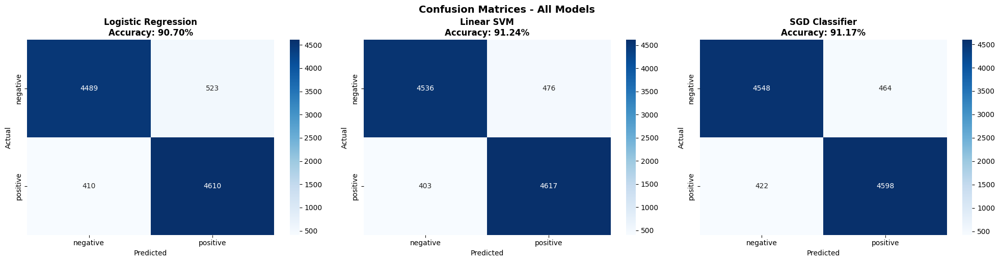

In [290]:
# CONFUSION MATRIX HEATMAP-

# Create space for 3 models-
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Store model predictions-
models_data = [
    ('Logistic Regression', test_preds_lr),
    ('Linear SVM', test_preds_svm),
    ('SGD Classifier', test_preds_sgd)
]

# Draw confusion matrix for each model-
for ax, (name, preds) in zip(axes, models_data):

    cm_matrix = confusion_matrix(y_test, preds)
    acc = accuracy_score(y_test, preds)

    sns.heatmap(
        cm_matrix,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=le.classes_,
        yticklabels=le.classes_,
        ax=ax
    )

    ax.set_title(
        f'{name}\nAccuracy: {acc*100:.2f}%',
        fontsize=12,
        fontweight='bold'
    )
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')

# Add main title
plt.tight_layout()
plt.suptitle(
    'Confusion Matrices - All Models',
    fontsize=14,
    fontweight='bold',
    y=1.02
)

plt.show()

## Step 42: Accuracy Comparison Chart

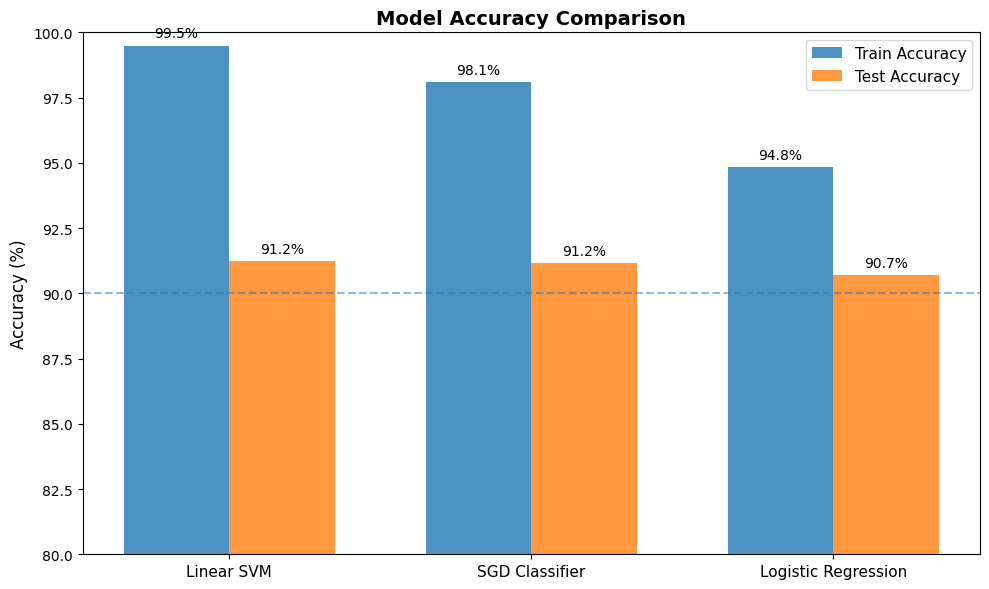

In [291]:
# ACCURACY COMPARISON-

fig, ax = plt.subplots(figsize=(10, 6))

# Get model names and accuracies-
model_names = results['Model'].tolist()
train_accs = results['Train Acc'].tolist()
test_accs = results['Test Acc'].tolist()

# Set bar positions-
x = np.arange(len(model_names))
width = 0.35

# Create bars-
bars1 = ax.bar(
    x - width/2,
    [a * 100 for a in train_accs],
    width,
    label='Train Accuracy',
    alpha=0.8
)

bars2 = ax.bar(
    x + width/2,
    [a * 100 for a in test_accs],
    width,
    label='Test Accuracy',
    alpha=0.8
)

# Add labels and title-
ax.set_ylabel('Accuracy (%)', fontsize=12)
ax.set_title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
ax.set_xticks(x)
ax.set_xticklabels(model_names, fontsize=11)
ax.legend(fontsize=11)

# Set y-axis range-
ax.set_ylim(80, 100)

# Add 90% reference line-
ax.axhline(
    y=90,
    linestyle='--',
    alpha=0.5,
    label='90% Target'
)

# Add accuracy values on bars-
for bar in bars1:
    ax.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 0.2,
        f'{bar.get_height():.1f}%',
        ha='center',
        va='bottom',
        fontsize=10
    )

for bar in bars2:
    ax.text(
        bar.get_x() + bar.get_width()/2,
        bar.get_height() + 0.2,
        f'{bar.get_height():.1f}%',
        ha='center',
        va='bottom',
        fontsize=10
    )

plt.tight_layout()
plt.show()

## Step 43: Cross-Validation (Robustness Check)

5-fold cross-validation confirms the model generalizes well and is not overfit to a single split.

In [292]:
# 5-FOLD CROSS-VALIDATION-

print('Running 5-fold cross-validation on Logistic Regression.')
print('This checks model performance on different data splits.\n')

# Use all data for cross-validation-
X_all = tfidf.transform(processed_texts)

# Create Logistic Regression model
lr_cv = LogisticRegression(
    C=1.0,
    max_iter=1000,
    solver='lbfgs',
    class_weight='balanced',
    random_state=42
)

# Perform 5-fold cross-validation-
cv_scores = cross_val_score(
    lr_cv,
    X_all,
    encoded_labels,
    cv=5,
    scoring='accuracy'
)

# Display results-
print('Cross-Validation Results:')

for i, score in enumerate(cv_scores, 1):
    print(f'Fold {i}: {score:.4f} ({score*100:.2f}%)')

# Calculate mean, standard deviation and range-
mean_acc = cv_scores.mean()
std_acc = cv_scores.std()
min_acc = cv_scores.min()
max_acc = cv_scores.max()

print(f'\nMean Accuracy: {mean_acc:.4f} ({mean_acc*100:.2f}%)')
print(f'Std Deviation: ±{std_acc:.4f}')
print(f'Range: {min_acc*100:.2f}% - {max_acc*100:.2f}%')

Running 5-fold cross-validation on Logistic Regression.
This checks model performance on different data splits.

Cross-Validation Results:
Fold 1: 0.9075 (90.75%)
Fold 2: 0.9053 (90.53%)
Fold 3: 0.9022 (90.22%)
Fold 4: 0.9038 (90.38%)
Fold 5: 0.9031 (90.31%)

Mean Accuracy: 0.9044 (90.44%)
Std Deviation: ±0.0019
Range: 90.22% - 90.75%


## Step 44: Saving the Best Model Artifacts

In [293]:
# SAVE MODEL ARTIFACTS-

# Save model files in two locations-
save_locations = [
    str(BASE_DIR),
    str(BASE_DIR / 'sentiment-analysis-api' / 'models')
]

for save_dir in save_locations:

    # Create folder if it does not exist-
    os.makedirs(save_dir, exist_ok=True)

    # File paths-
    model_path = os.path.join(
        save_dir, 'logistic_regression_model.pkl'
    )
    tfidf_path = os.path.join(
        save_dir, 'tfidf_vectorizer.pkl'
    )
    le_path = os.path.join(
        save_dir, 'label_encoder.pkl'
    )

    # Save trained model and preprocessing objects-
    joblib.dump(best_model, model_path)
    joblib.dump(tfidf, tfidf_path)
    joblib.dump(le, le_path)

    # Display saved files-
    print(f'Saved to: {save_dir}')
    print(f'Model : {os.path.basename(model_path)}')
    print(f'Vectorizer : {os.path.basename(tfidf_path)}')
    print(f'Encoder : {os.path.basename(le_path)}')
    print()

Saved to: D:\Sentiment Project
Model : logistic_regression_model.pkl
Vectorizer : tfidf_vectorizer.pkl
Encoder : label_encoder.pkl

Saved to: D:\Sentiment Project\sentiment-analysis-api\models
Model : logistic_regression_model.pkl
Vectorizer : tfidf_vectorizer.pkl
Encoder : label_encoder.pkl



## Step 45: Interactive Sentiment Prediction

In [294]:
# SENTIMENT PREDICTION FUNCTION

def predict_sentiment(
    text,
    model=best_model,
    vectorizer=tfidf,
    encoder=le
):

    # Preprocess the input-
    processed = preprocess_text(text)

    # Convert text to TF-IDF features-
    features = vectorizer.transform([processed])

    # Predict sentiment-
    prediction = model.predict(features)[0]

    # Get prediction probabilities-
    probabilities = model.predict_proba(features)[0]

    # Convert prediction to original label-
    label = encoder.inverse_transform([prediction])[0]

    # Get confidence-
    confidence = probabilities[prediction]

    return {
        'text': text[:100] + '...' if len(text) > 100 else text,
        'sentiment': label,
        'confidence': f'{confidence:.2%}',
        'probabilities': {
            cls: f'{prob:.4f}'
            for cls, prob in zip(
                encoder.classes_,
                probabilities
            )
        }
    }

In [295]:
# TEST SENTIMENT PREDICTIONS-

test_cases = [
    "This movie was absolutely fantastic! Best film I've seen all year.",
    "Terrible waste of time. The acting was horrible and the plot made no sense.",
    "The product arrived on time and works as described.",
    "I wouldn't recommend this to anyone. Complete disappointment.",
    "Loved every minute of it! The characters were so well developed.",
    "Not bad, but not great either. It was okay.",
    "This is the worst experience I've ever had. Never again!",
    "Absolutely brilliant performance by the lead actor!"
]

# Display predictions-
print('Sentiment Predictions:')
print('=' * 80)

for text in test_cases:

    result = predict_sentiment(text)

    print(
        f"[{result['sentiment']:>8s}] "
        f"({result['confidence']:>7s}) | "
        f"{result['text']}"
    )

print('=' * 80)

Sentiment Predictions:
[positive] ( 99.84%) | This movie was absolutely fantastic! Best film I've seen all year.
[negative] (100.00%) | Terrible waste of time. The acting was horrible and the plot made no sense.
[negative] ( 51.24%) | The product arrived on time and works as described.
[negative] ( 99.90%) | I wouldn't recommend this to anyone. Complete disappointment.
[positive] ( 90.09%) | Loved every minute of it! The characters were so well developed.
[negative] ( 99.87%) | Not bad, but not great either. It was okay.
[negative] ( 96.30%) | This is the worst experience I've ever had. Never again!
[positive] ( 97.57%) | Absolutely brilliant performance by the lead actor!


## Step 46: FastAPI Web Service

Modern REST API with automatic OpenAPI documentation.

**To run the API separately:**
```bash
cd sentiment-analysis-api
uvicorn app:app --reload --port 5000
```
Then visit: http://127.0.0.1:5000/docs

In [296]:
# FASTAPI APPLICATION (for reference - run separately via uvicorn)


print(' FastAPI app code is in: sentiment-analysis-api/app.py')
print(' Run with: uvicorn app:app --reload --port 5000')
print(' Docs at : http://127.0.0.1:5000/docs')
print()
print('Example API usage:')
print(' curl -X POST http://127.0.0.1:5000/predict \\')
print(' -H "Content-Type: application/json" \\')
print(' -d \'{"text": "This movie was amazing!"}\'')

 FastAPI app code is in: sentiment-analysis-api/app.py
 Run with: uvicorn app:app --reload --port 5000
 Docs at : http://127.0.0.1:5000/docs

Example API usage:
 curl -X POST http://127.0.0.1:5000/predict \
 -H "Content-Type: application/json" \
 -d '{"text": "This movie was amazing!"}'
